# Libraries to be imported

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import butter, sosfiltfilt
from ecg_detectors.ecgdetectors import panPeakDetect, searchBack
import wfdb
import scipy.signal as signal
import peakutils
import os
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

# Loading the Data

In [2]:
flist = os.listdir('/Users/chaitanya/Downloads/ecg-id-database-1.0.0/Person_02/')
flist = [file for file in flist if file.endswith('.dat')]

In [3]:
records={}
signal_slice={}
filtered_signal={}
smoothed_signal={}
r_peaks={}
flist = os.listdir('/Users/chaitanya/Downloads/ecg-id-database-1.0.0/Person_02/')
flist = [file for file in flist if file.endswith(".dat")]   
for file in flist:
    records[file] = wfdb.rdrecord('/Users/chaitanya/Downloads/ecg-id-database-1.0.0/Person_02/'+file[:-4],channels=[1])

In [4]:
data={}
for rec in records:
    data[rec] = np.ndarray.flatten(records[rec].p_signal[:])

In [5]:
times={}
fs=200
for rec in records:
    times[rec] = np.arange(data[rec].shape[0], dtype='float') / fs

# Pre-processing the signal

In [6]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    sos = butter(order, [low, high], analog=False, btype="band", output="sos")
    return sos

def butter_bandpass_forward_backward_filter(data, lowcut, highcut, fs, order=5):
    sos = butter_bandpass(lowcut, highcut, fs, order=order)
    y = sosfiltfilt(sos,
                    data)  # Apply a digital filter forward and backward to a signal.This function applies a linear digital filter twice, once forward and once backwards. The combined filter has zero phase and a filter order twice that of the original.
    return y

# CHOOSING PAN_TOMPKINS_DETECTOR, AS IT IS THE MOST EFFICIENT R-PEAK DETECTOR

In [7]:
def pan_tompkins_detector(raw_ecg, mwa, fs, N):
#     N = int(0.12 * fs)
#     mwa = MWA(squared, N)
#     mwa[:int(0.2 * fs)] = 0

    N = int(N / 100 * fs)
    mwa_peaks = panPeakDetect(mwa, fs)

    r_peaks = searchBack(mwa_peaks, raw_ecg, N)

    return r_peaks

In [8]:
lowcut = 0.05 * 3.3  
highcut = 15 
x={}
times={}
y={}
for rec in records:
    x[rec] = data[rec][:]
    times[rec] = np.arange(x[rec].shape[0], dtype='float') / fs
    y[rec] = butter_bandpass_forward_backward_filter(x[rec], lowcut, highcut, fs, order=4)

In [9]:
for rec in records:
    smoothed_signal[rec]=signal.cspline1d(y[rec],lamb=500)

# Finding : r-peaks

In [10]:
differentiated_ecg_measurements={}
squared_ecg_measurements={}
integration_window = 25
integrated_ecg_measurements={}
rpeaks={}
for rec in records:
    differentiated_ecg_measurements[rec] = np.ediff1d(y[rec])

    # Squaring - intensifies values received in derivative. 
    # This helps restrict false positives caused by T waves with higher than usual spectral energies..
    squared_ecg_measurements[rec] = differentiated_ecg_measurements[rec] ** 2

    # Moving-window integration.
    # Change proportionally when adjusting frequency (in samples)
    integrated_ecg_measurements[rec] = np.convolve(squared_ecg_measurements[rec], np.ones(integration_window))

    # Fiducial mark - peak detection on integrated measurements.
    rpeaks[rec] = pan_tompkins_detector(smoothed_signal[rec], integrated_ecg_measurements[rec], fs, integration_window)

In [11]:
r_peaks_utils={}
for rec in records:
    r_peaks_utils[rec]=list((peakutils.indexes(smoothed_signal[rec][0:500],thres=0.85,min_dist=200)))

In [12]:
for rec in records:
    lis=np.subtract(rpeaks[rec],r_peaks_utils[rec][0])
    ind=[i for i in range(len(lis)) if lis[i]==0]
    if ind!=[]:
        rpeaks[rec]=rpeaks[rec][ind[0]:]

In [13]:
rpeaks['rec_8.dat'][0]

279

In [14]:
r_peaks={}
for rec in records:
    r_peaks[rec]=[]
    for i in range(len(rpeaks[rec])-1):
        if abs(rpeaks[rec][i]-rpeaks[rec][i+1])>=200:
            r_peaks[rec].append(rpeaks[rec][i])
        elif abs(rpeaks[rec][i]-rpeaks[rec][i+2])>=200:
            r_peaks[rec].append(rpeaks[rec][i])
    if (abs(rpeaks[rec][len(rpeaks[rec])-1]-rpeaks[rec][len(rpeaks[rec])-2])>=200):
        r_peaks[rec].append(rpeaks[rec][len(rpeaks[rec])-1])

In [15]:
for rec in records:
    r_peaks[rec]=np.array(r_peaks[rec])

In [16]:
rpeaks['rec_18.dat'],r_peaks['rec_18.dat']

(array([  89,  154,  240,  388,  479,  626,  867, 1113, 1369, 1632, 1890,
        2148, 2407, 2669, 2936, 3210, 3479, 3752, 4038, 4321, 4601, 4875,
        5151, 5415, 5679, 5943, 6201, 6456, 6714, 6978, 7254, 7546, 7835,
        8118, 8402, 8687, 8966, 9244, 9517, 9791]),
 array([ 154,  240,  388,  479,  626,  867, 1113, 1369, 1632, 1890, 2148,
        2407, 2669, 2936, 3210, 3479, 3752, 4038, 4321, 4601, 4875, 5151,
        5415, 5679, 5943, 6201, 6456, 6714, 6978, 7254, 7546, 7835, 8118,
        8402, 8687, 8966, 9244, 9517, 9791]))

In [17]:
fig=go.Figure()
fig1=go.Figure()

# for rec in range(len(series_slice['rec_8.dat'])):
fig.add_trace(go.Scatter(
    y=smoothed_signal['rec_18.dat'][0:1000],
    mode="lines+markers",
))

fig.update_layout(
    title="Signal_slice : rec_8.dat",
    xaxis_title="Time",
    yaxis_title="Values",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="Blue"
    )
)

fig.show()

# Plot to check the r_peaks

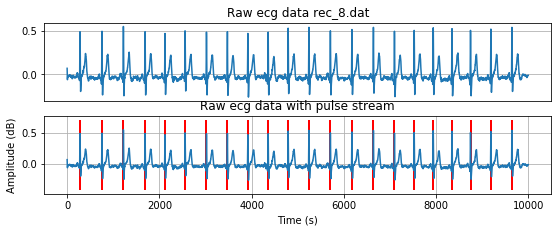

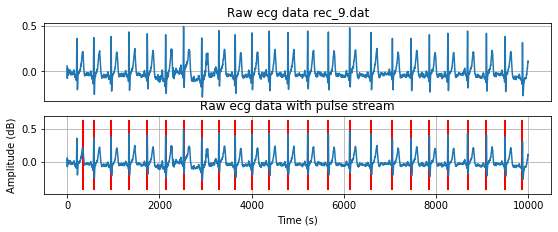

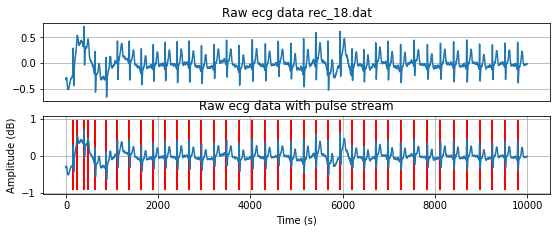

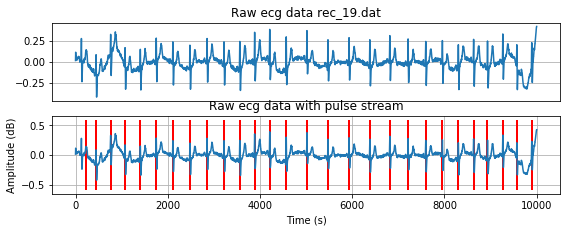

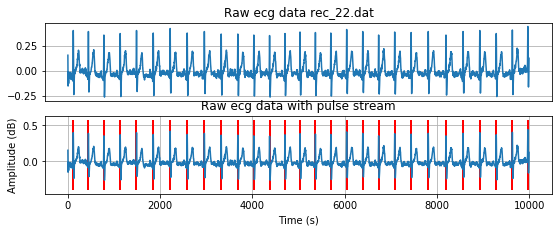

...

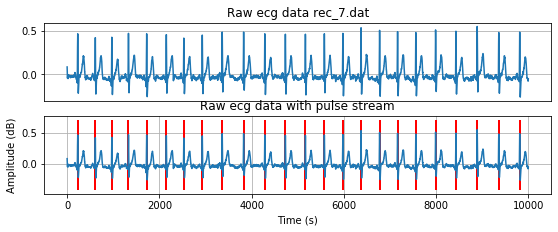

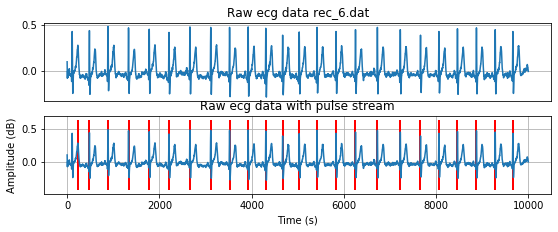

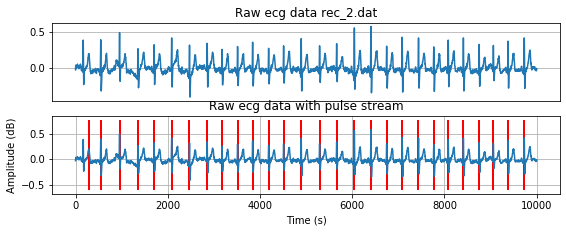

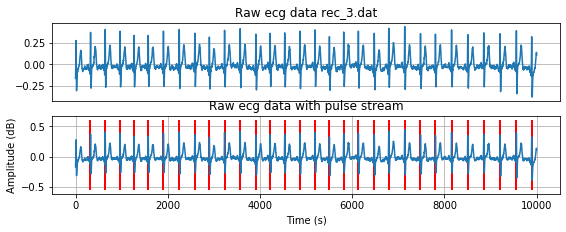

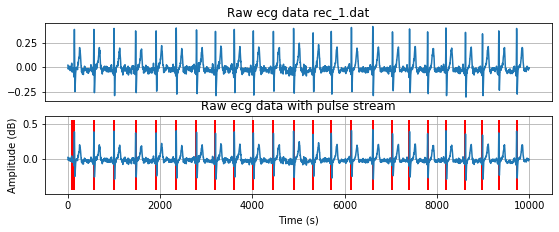

In [18]:
figsize = (20, 10)

ymin={}
ymax={}

for rec in records:
    plt.figure(figsize=figsize)

    plt.subplot2grid((6, 2), (0, 0))
    # plt.subplot(621)
    # plt.figure(1, figsize=left_figsize)
    # plt.clf()
    plt.xticks([])
    plt.plot(data[rec])
    plt.title("Raw ecg data "+str(rec))
    plt.grid(True)
    
    ymin[rec] = np.min(data[rec])
    ymax[rec] = np.max(data[rec])
    alpha = 0.2 * (ymax[rec] - ymin[rec])
    ymax[rec] += alpha
    ymin[rec] -= alpha

    # plt.figure(figsize=left_figsize)
    # plt.subplot(626)
    plt.subplot2grid((6, 2), (1, 0))
    # plt.clf()
    plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
    plt.xlabel("Time (s)")
    plt.plot(times, data[rec])
    plt.vlines(r_peaks[rec], ymin[rec], ymax[rec],
               color="r",
               linewidth=2,
               label="R-peaks")
    plt.title("Raw ecg data with pulse stream")
    plt.grid(True)

# Crop the signal from rpeaks

# Determine the min_length of a signal

Since the r-peak detected at the initial time of a signal is improper. I've consider the minimum distance between the r-peaks be the average of smallest distance and largest distance.

In [148]:
min_dist={}
min_dist_mn={}
for rec in records:
    min_dist_mn[rec]=[]
    for peak in range(len(r_peaks[rec])-1):
        min_dist_mn[rec].append(r_peaks[rec][peak+1]-r_peaks[rec][peak])
    dist_min = min(min_dist_mn[rec])
    dist_max = max(min_dist_mn[rec])
    dist_avg = (dist_min+dist_max)//2
    min_dist[rec]= integration_window #dist_avg # HYPER-PARAMETER      

In [149]:
len(data['rec_18.dat'][r_peaks['rec_18.dat'][4]:r_peaks['rec_18.dat'][5]])

241

# Slicing the signal

In [150]:
series_slice={}
map_slice={}
for rec in records:
    count=0
    series_slice[rec]={}
    map_slice[rec]=[]
    for peak in range(len(r_peaks[rec])-1):
        if len(data[rec][r_peaks[rec][peak]:r_peaks[rec][peak+1]])>min_dist[rec]:
            series_slice[rec][count]=data[rec][r_peaks[rec][peak]:r_peaks[rec][peak+1]]
            count=count+1
            if count==1:
                map_slice[rec].append([count,peak])

In [151]:
map_sum={}
for rec in records:
    map_sum[rec]=[]
    for i in map_slice[rec]:
        map_sum[rec].append(i[1]-i[0])

In [152]:
map_sum['rec_18.dat'][0]

-1

# Plotting the sliced signals

In [153]:
import plotly.graph_objects as go
fig=go.Figure()
for rec in records:
    for peak in range(len(series_slice[rec])-1):
        fig.add_trace(go.Scatter(
            y=series_slice[rec][peak],
            mode="lines",
            name=rec
    ))
# Titles=""
# for i in range(num_discords):
#     Title=discords['sel803.dat'][i][0]
#     Titles+=" "+str(Title)
fig.update_layout(
title="Signal_slice",
xaxis_title="X",
yaxis_title="F",
autosize=True,
margin=dict(
    l=50,
    r=50,
    b=100,
    t=100,
    pad=20
),
# paper_bgcolor="LightSteelBlue",
font=dict(
    family="Courier New, monospace",
    size=18,
    color="Blue"
    )
)
fig.show()

In [154]:
fig=go.Figure()
fig1=go.Figure()

for rec in range(len(series_slice['rec_18.dat'])):
    fig.add_trace(go.Scatter(
        y=series_slice['rec_18.dat'][rec],
        mode="lines+markers",
    ))

fig.update_layout(
    title="Signal_slice : rec_8.dat",
    xaxis_title="Time",
    yaxis_title="Values",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="Blue"
    )
)

fig.show()

In [64]:
fig=go.Figure()
fig1=go.Figure()

# for rec in range(len(series_slice['rec_8.dat'])):
fig.add_trace(go.Scatter(
    y=data['rec_18.dat'][0:2000],
    mode="lines+markers",
))

fig.update_layout(
    title="Signal_slice : rec_8.dat",
    xaxis_title="Time",
    yaxis_title="Values",
    font=dict(
        family="Courier New, monospace",
        size=18,
        color="Blue"
    )
)

fig.show()

# RMSE

In [155]:
def rms_dd(s_array):
    rmse_={}
    for i in range(len(s_array)):
        data1f=np.array(s_array[i][:50])
        data1l=np.array(s_array[i][-50:])
        data1=np.concatenate((data1f,data1l),axis=0)
        rmse_[i]={}
        
        for j in range(len(s_array)):
            sum1=0
            data2f=np.array(s_array[j][:50])
            data2l=np.array(s_array[j][-50:])
            data2=np.concatenate((data2f,data2l),axis=0)
#             if len(s_array[i])>len(s_array[j]):
#                 data1=s_array[i][0:(len(s_array[i])-(len(s_array[i])-len(s_array[j])))]
#             elif len(s_array[j]>len(s_array[i])):
#                 data2=s_array[j][0:(len(s_array[j])-(len(s_array[j])-len(s_array[i])))]
            for k in range(len(data1)):
                m=len(data1)
                sum1=sum1+((abs(data1[k]-data2[k]))**2)
            rmse_[i][j]=(np.sqrt(sum1))/m
    return rmse_

# MSE

In [156]:
def mse_dd(s_array):
    mse_={}

    for i in range(len(s_array)):
        data1=np.array(s_array[i])
        mse_[i]={}
        
        for j in range(len(s_array)):
            sum1=0
            data2=np.array(s_array[j])
            if len(s_array[i])>len(s_array[j]):
                data1=s_array[i][0:(len(s_array[i])-(len(s_array[i])-len(s_array[j])))]
            elif len(s_array[j]>len(s_array[i])):
                data2=s_array[j][0:(len(s_array[j])-(len(s_array[j])-len(s_array[i])))]
                
            #Normalize the data b/w 0 and 1
            
            norm1=((data1-min(data1))/(max(data1)-min(data1)))
            norm2=((data2-min(data2))/(max(data2)-min(data2)))

            for k in range(len(norm1)):
                m=len(norm1)
                sum1=sum1+((abs(norm1[k]-norm2[k]))**2)
            mse_[i][j]=(sum1)/m
    return mse_

In [157]:
rmse={}
for rec in records:
    rmse[rec]=rms_dd(series_slice[rec])

In [158]:
mse={}
for rec in records:
    mse[rec]=mse_dd(series_slice[rec])

# For each record, for each signal slice, the signal with maximum RMSE is picked :

In [160]:
def abnormal_discord_rmse():
    v={}
    for rec in records:
        v[rec]={}
        for val in range(len(rmse[rec])):
            val1=[(x,y) for x,y in rmse[rec][val].items() if y==max(rmse[rec][val].values())]
            v[rec][val]=val1
            v[rec][val]=np.array(v[rec][val]).flatten()
    return v

In [161]:
def abnormal_discord_mse():
    v={}
    for rec in records:
        v[rec]={}
        for val in range(len(mse[rec])):
            val1=[(x,y) for x,y in mse[rec][val].items() if y==max(mse[rec][val].values())]
            v[rec][val]=val1
            v[rec][val]=np.array(v[rec][val]).flatten()
    return v

In [162]:
ab_discords_rmse=abnormal_discord_rmse()

In [163]:
ab_discords_mse=abnormal_discord_mse()

# Counting the No. of times the signal being detected as abnormal

In [187]:
def count_rmse():
    count={}
    for rec in records:
        count[rec]={}
        ind=-1
        pre_val={0}
        for i in ab_discords_rmse[rec].values():
            val=i[0]
            k=0
            if val not in pre_val:
                ind=ind+1
            for j in ab_discords_rmse[rec].values():
                if j[0]==val:
                    k=k+1
            if val not in pre_val:
                count[rec][ind]=[val,k]
            pre_val.add(i[0])
    return count

In [188]:
def count_mse():
    count={}
    for rec in records:
        count[rec]={}
        ind=-1
        pre_val={0}
        for i in ab_discords_mse[rec].values():
            val=i[0]
            k=0
            if val not in pre_val:
                ind=ind+1
            for j in ab_discords_mse[rec].values():
                if j[0]==val:
                    k=k+1
            if val not in pre_val:
                count[rec][ind]=[val,k]
            pre_val.add(i[0])
    return count

# Selecting Top 5 signals

In [197]:
def max_dd_rmse(count_rmse):
    max_dd={}
    cnt_ind={}
    cnt_val={}
    for rec in records:
        max_dd[rec]=[]
        cnt_ind[rec]=[]
        cnt_val[rec]=[]
        for i in count_rmse[rec].values():
            cnt_ind[rec].append(i[0])
            cnt_val[rec].append(i[1])
        if len(count_rmse[rec])>5:
            for i in range(5):
                m_val=max(cnt_val[rec])
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
        else:
            for i in range(len(count_rmse[rec])):
                m_val=max(cnt_val[rec])         
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
    return max_dd

In [198]:
def max_dd_mse(count_mse):
    max_dd={}
    cnt_ind={}
    cnt_val={}
    for rec in records:
        max_dd[rec]=[]
        cnt_ind[rec]=[]
        cnt_val[rec]=[]
        for i in count_mse[rec].values():
            cnt_ind[rec].append(i[0])
            cnt_val[rec].append(i[1])
        if len(count_mse[rec])>5:
            for i in range(5):
                m_val=max(cnt_val[rec])
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
        else:
            for i in range(len(count_mse[rec])):
                m_val=max(cnt_val[rec])         
                m_ind=cnt_val[rec].index(m_val)
                cnt_val[rec].remove(m_val)
                max_dd[rec].append(cnt_ind[rec][m_ind])
                cnt_ind[rec].remove(cnt_ind[rec][m_ind])
            max_dd[rec]=set(max_dd[rec])
            max_dd[rec]=list(max_dd[rec])
    return max_dd

In [200]:
cnt_rmse=count_rmse()
cnt_mse=count_mse()
max_rmse=max_dd_rmse(cnt_rmse)
max_mse=max_dd_mse(cnt_mse)

# Plot to Check Anomalous signals obtained through RMSE and MSE

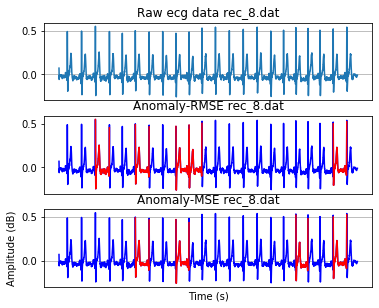

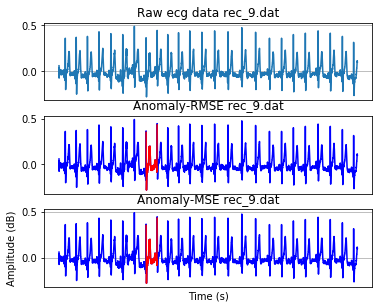

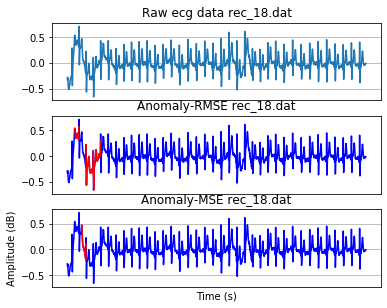

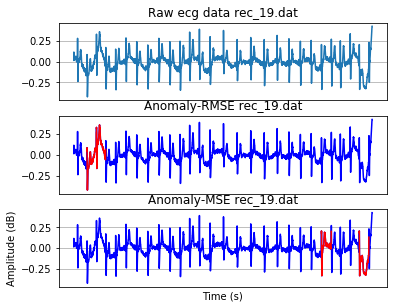

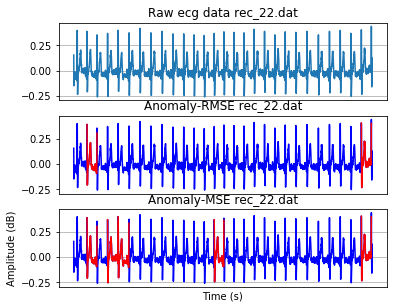

...

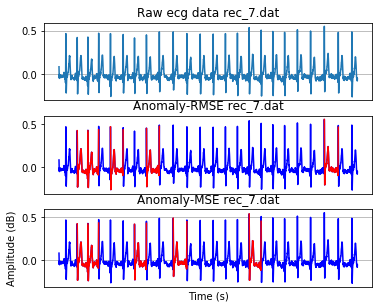

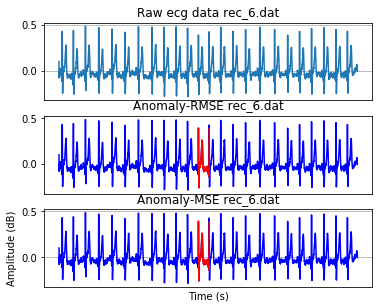

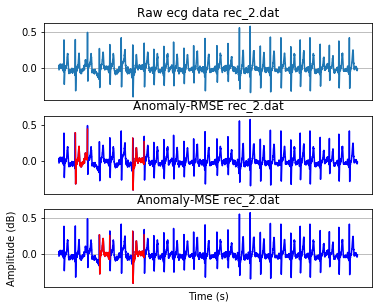

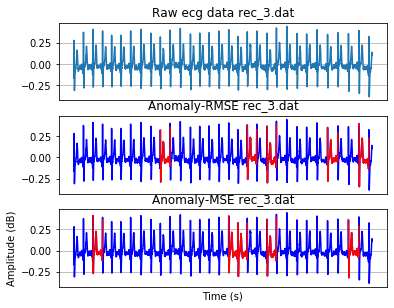

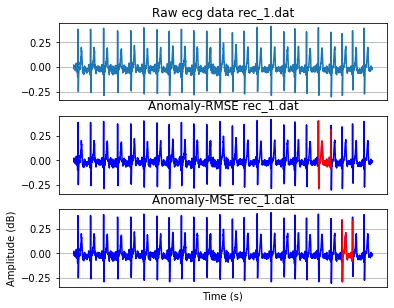

In [213]:
figsize = (20, 10)

ymin={}
ymax={}

for rec in records:
    plt.figure(figsize=figsize)

    plt.subplot2grid((6, 3), (0, 0))
    # plt.subplot(621)
    # plt.figure(1, figsize=left_figsize)
    # plt.clf()
    plt.xticks([])
    plt.plot(data[rec])
    plt.title("Raw ecg data "+str(rec))
    plt.grid(True)
    
    ymin[rec] = np.min(data[rec])
    ymax[rec] = np.max(data[rec])
    alpha = 0.2 * (ymax[rec] - ymin[rec])
    ymax[rec] += alpha
    ymin[rec] -= alpha

    # plt.figure(figsize=left_figsize)
    # plt.subplot(626)
    plt.subplot2grid((6, 3), (1, 0))
    plt.xticks([])
    # plt.clf()
#     plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
#     plt.xlabel("Time (s)")
    plt.plot(data[rec],color='b')
    for i in range(len(max_rmse[rec])):
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(r_peaks[rec][int(max_rmse[rec][i])]+1,r_peaks[rec][int(max_rmse[rec][i])+1]),data[rec][r_peaks[rec][int(max_rmse[rec][i])]+1:r_peaks[rec][int(max_rmse[rec][i])+1]],color='r')
    plt.title("Anomaly-RMSE "+str(rec))
    
    plt.subplot2grid((6, 3), (2, 0))
    plt.xticks([])
    # plt.clf()
    plt.ylabel("Amplitude (dB)")
    # Calculate time values in seconds
    times = np.arange(data[rec].shape[0], dtype='float')
    plt.xlabel("Time (s)")
    plt.plot(data[rec],color='b')
    for i in range(len(max_mse[rec])):
#         plt.plot(np.concatenate((data[rec][:r_peaks[rec][int(max_dd[rec][i])+(map_sum[rec][0])]-1],data[rec][r_peaks[rec][int(max_dd[rec][i])]+1:r_peaks[rec][int(max_dd[rec][i])+1]]),axis=0),color='b')
        plt.plot(range(r_peaks[rec][int(max_mse[rec][i])]+1,r_peaks[rec][int(max_mse[rec][i])+1]),data[rec][r_peaks[rec][int(max_mse[rec][i])]+1:r_peaks[rec][int(max_mse[rec][i])+1]],color='r')
    plt.title("Anomaly-MSE "+str(rec))
    
    plt.grid(True)